In [1]:
from IPython.display import HTML

In [2]:
%%html
<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The Python code is hidden for easy reading. To view it click <a href="javascript:code_toggle()">here</a>

The purpose of this notebook is to detect anomalies in time series using autoencoders.

## Contents
1. [What is an auto encoder?](#introduction)
2. [How to use it in anomaly detection?](#app)
3. [Example of application on a simple series](#simple)
4. [Application to complex series](#astrolog)
5. [Conclusion](#conclusion)


# What is an auto encoder? ? <a name="introduction"></a>

An auto encoder is a neural network that learns a representation of data in a smaller dimension. In concrete terms, it is given a vector and is expected to return the same vector, in other words, it rebuilds its entry.

The structure of a simple auto encoder is shown in the following image.

The auto encoder is composed of an encoder, which takes an X vector as input and returns a smaller Z vector.

The second part of the auto encoder, the decoder, takes as input the small vector returned by the encoder (Z) and returns a vector of the same size as X.


* X is the input vector
* Z is an "encoding" of X
* X' is a "reconstruction" of X

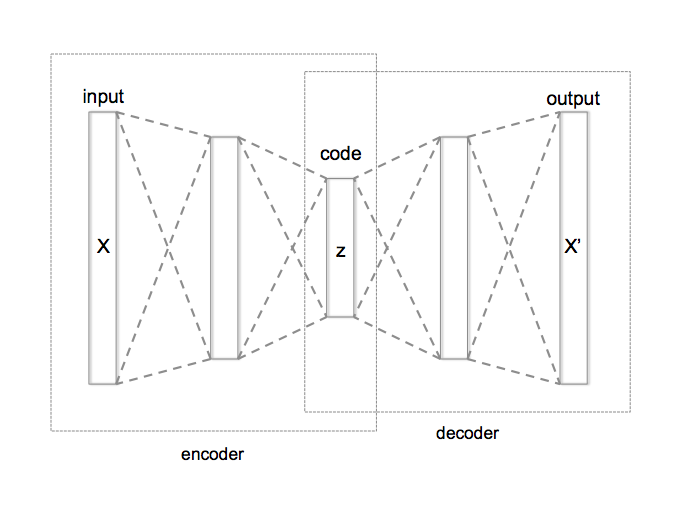

In [3]:
from IPython.display import Image
Image(filename="Data/Autoencoder_structure.png")

It is hoped that the neural layers of the encoder will be able to extract characteristic features of the input vector. For example, if the input vector is a sinusoid with a length of 2000 points, it is hoped that the auto encoder will "understand it" and be able to encode it with a very small vector.

# How to use it in anomaly detection?<a name="app"></a>

In the context of anomaly detection (unsupervised), the classic approach is to train a model, at each moment, to predict the next point. If the observed point is too far from the prediction, the point is declared an anomaly.

In the case of an autoencoder, the objective is to train a network of neurons to learn the patterns of a curve over normal periods. Thereafter, the network will be able to reproduce the curve as long as the patterns of the curve do not change. If the patterns change, the reproduction made by the autoencoder will be less accurate and we will be able to detect this change.


# Example of application on a simple series <a name="simple"></a>

In [4]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.autograd import Variable
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

In [5]:
import logging
handler=logging.basicConfig(level=logging.INFO)
lgr = logging.getLogger(__name__)

#Utilisation des GPUs
#use_cuda = torch.cuda.is_available()
use_cuda = False

FloatTensor = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_cuda else torch.LongTensor
Tensor = FloatTensor

#lgr.info("USE CUDA=" + str (use_cuda))

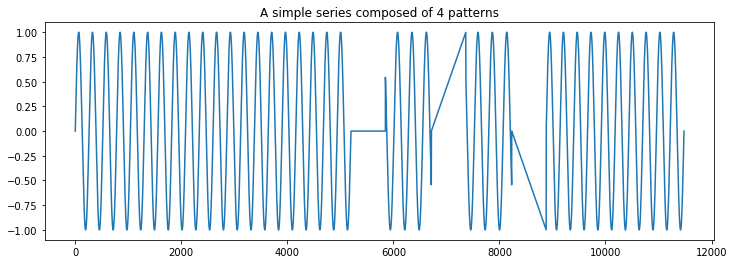

In [6]:
def Rand(num):
    res = []
    for j in range(num):
        res.append(random.random())
    return res



##### series 0 - half sine, half linear
nb_periods=10
nb_points=2600
x = np.linspace(-nb_periods*np.pi, nb_periods*np.pi, nb_points)
x2 = np.linspace(int(-nb_periods*np.pi/3), int(nb_periods*np.pi/3), int(nb_points/3))
aa=list(np.sin(x))
bb=list(np.zeros(int(nb_points/4)))
cc=list(np.sin(x2))
dd=list(np.arange(int(nb_points/4))/int(nb_points/-4))
ee=list(np.arange(int(nb_points/4))/int(nb_points/4))
y=list(np.arange(len(aa+aa+bb+cc+dd+aa)))
# On joint nos 3 patterns
serie_simple=np.array(aa+aa+bb+cc+ee+cc+dd+aa)

# Visualisation 
fig=plt.figure(figsize=(12,4))
plt.plot(serie_simple)
plt.title("A simple series composed of 4 patterns")
plt.show()

First of all, it is a matter of training the auto encoder so that it understands the characteristics of the series over a so-called "normal" period. 

To generate the training data, a sliding window of a limited size will be applied to the series, but it will still capture the characteristics of the series.

**In practice, the size of the sliding window is equal to the minimum size of a pattern.**

Let's take a window size of 128.

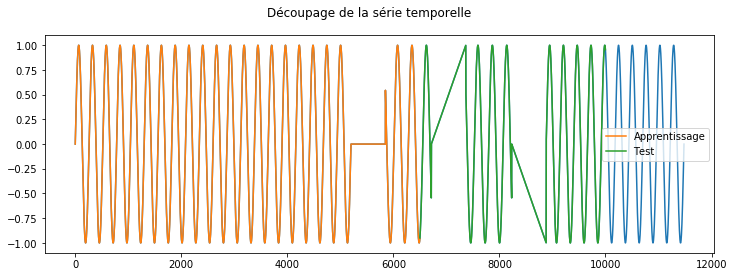

In [7]:
fig=plt.figure(figsize=(12,4))
dataframe = pd.DataFrame(serie_simple.astype('float32'))
df_total=dataframe
plt.plot(df_total)

df= dataframe[:6500]
plt.plot(df,label="Apprentissage")

df_test= dataframe[6500:10000]
plt.plot(df_test,label="Test")
plt.legend()
plt.suptitle("Découpage de la série temporelle")
plt.show()

In [8]:
dataset = df.values
dataset_test = df_test.values

In [9]:
def normalize_test(dataset,dataset_test):
    """
    Permet de normaliser les valeurs de la time-series [0;1] par rapport aux valeurs de la période d'apprentissage
    
    Inputs : 
        data = np array 1D correspondant à une série temporelle
    Output : np.array 1D normalisé
    """
    max_value = np.max(dataset)
    min_value = np.min(dataset)
    scalar = max_value - min_value
    dataset = list(map(lambda x: (x-min_value)   / scalar, dataset))
    dataset_test = list(map(lambda x: (x-min_value)   / scalar, dataset_test))
    return dataset , dataset_test

dataset,dataset_test=normalize_test(dataset,dataset_test)


In [10]:
def rolling_window(data,look_back,pattern_indices=[]):
    """
    Inputs : 
        data = np array 1D correspondant à une série temporelle
        pattern_indices = quand ils sont connus, les indices de changements de patterns
        look_back : taille de la fenêtre glissante
    Output : un np.array 2D avec "look_back" columns 
    """
    dataX=[]
    for i in range(len(data)-look_back-1):
        a = data[i:(i+look_back)]
        dataX.append(list(a))

    dataX=np.array(dataX)
    return dataX

In [11]:
look_back=128
data_X=rolling_window(dataset,look_back)
#print(data_X.shape)
data_X=data_X.reshape(-1, 1,look_back)
#print(data_X.shape)

if use_cuda:
        #lgr.info ("Using the GPU")    
        train_x = torch.from_numpy(data_X).float().cuda() # Note the conversion for pytorch    
else:
        #lgr.info ("Using the CPU")
        train_x = torch.from_numpy(data_X).float() # Note the conversion for pytorch


In [12]:
class autoencoder(nn.Module):
    def __init__(self ,input_size):
        super(autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_size, 128),
            nn.ReLU(True),
            nn.Linear(128, 32),
            nn.ReLU(True),
            nn.Linear(32, 12),
            nn.ReLU(True), 
            nn.Linear(12, 3))
        self.decoder = nn.Sequential(
            nn.Linear(3, 12),
            nn.ReLU(True),
            nn.Linear(12, 32),
            nn.ReLU(True),
            nn.Linear(32, 128),
            nn.ReLU(True),
            nn.Linear(128, input_size), 
            nn.Tanh())

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [13]:
net = autoencoder(look_back)

In [14]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(net.parameters(), lr=0.01)

In [15]:
if use_cuda:
    lgr.info ("Using the GPU")    
    net.cuda()
    criterion.cuda()

The metric allowing us to calculate the performance of the autoencoder is **Mean Squared Error (MSE)**

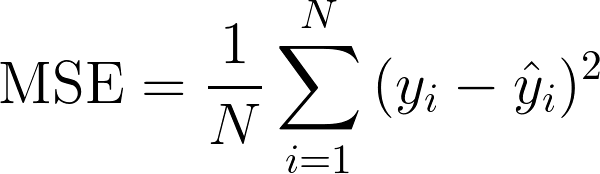

In [16]:
from IPython.display import Image
Image(filename="Data/mse.png")

**Let's train our autoencoder :  **

In [17]:
net_loss=[]
for e in range(500):
    var_x = Variable(train_x)
    out = net(var_x)
    loss = criterion(out, var_x)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    net_loss.append(loss.item())
    if (e + 1) % 50 == 0:
        print('Epoch: {}, Loss: {:.5f}'.format(e + 1, loss.item()))     

Epoch: 50, Loss: 0.05636
Epoch: 100, Loss: 0.05494
Epoch: 150, Loss: 0.05485
Epoch: 200, Loss: 0.05481
Epoch: 250, Loss: 0.05479
Epoch: 300, Loss: 0.05477
Epoch: 350, Loss: 0.05455
Epoch: 400, Loss: 0.00557
Epoch: 450, Loss: 0.00125
Epoch: 500, Loss: 0.00099


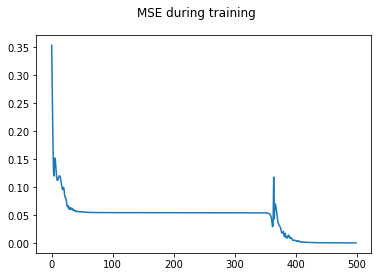

In [18]:
plt.suptitle("MSE during training ")
plt.plot(net_loss)
plt.show()

In [19]:
net = net.eval()
if use_cuda:
    lgr.info ("Using the GPU")    
    net.cuda()

In [20]:
var_data = Variable(train_x)
pred_test = net(var_data)
pred_test = pred_test.view(-1,128)

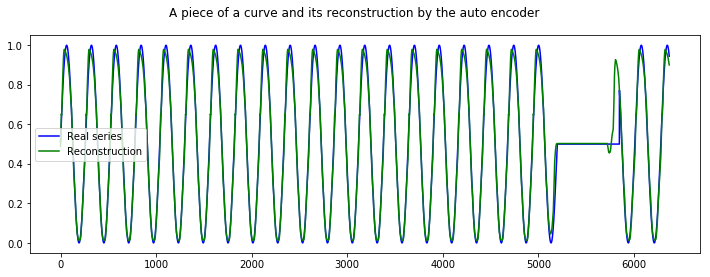

In [21]:
def reconstruction_viz(train_x,autoencoder,lookback,index=0):
    var_data = Variable(train_x)
    pred_test = net(var_data)
    pred_test = pred_test.view(-1,lookback).data.cpu().numpy()
    data = train_x.view(-1,lookback).data.cpu().numpy()
    fig=plt.figure(figsize=(12,4))
    plt.plot(data[:,1],color="blue",label="Real series")
    plt.plot(pred_test[:,1],color="green",label="Reconstruction")
    plt.legend()
    plt.suptitle("A piece of a curve and its reconstruction by the auto encoder")
    plt.show()

reconstruction_viz(train_x,net,look_back,index=0)

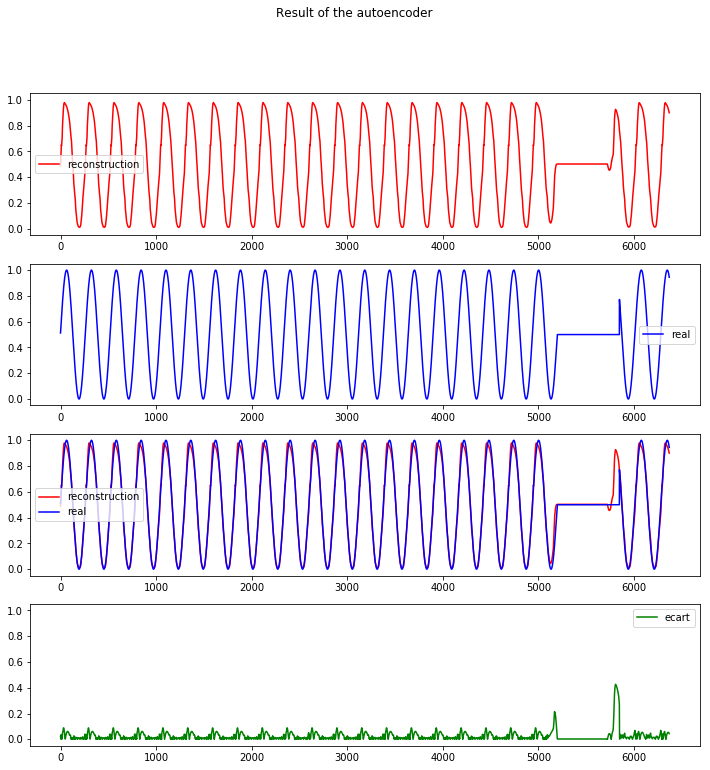

In [22]:
def reconstruction_viz2(train_x,autoencoder,lookback,index=0):
    var_data = Variable(train_x)
    pred_test = net(var_data)
    pred_test = pred_test.view(-1,lookback).data.cpu().numpy()
    data = train_x.view(-1,lookback).data.cpu().numpy()
    ecart= np.abs(np.subtract(data[:,1],pred_test[:,1]))
    
    fig, ax = plt.subplots(nrows=4, sharey=True,figsize=(12,12))
    ax[0].plot(pred_test[:,1], 'r', label='reconstruction')
    ax[0].legend(loc='best')
    ax[1].plot(data[:,1], 'b', label='real')
    ax[1].legend(loc='best')
    ax[2].plot(pred_test[:,1], 'r', label='reconstruction')
    ax[2].plot(data[:,1], 'b', label='real')
    ax[2].legend(loc='best')
    ax[3].plot(ecart, 'g', label='ecart')
    ax[3].legend(loc='best')
    plt.legend()
    plt.suptitle("Result of the autoencoder")
    plt.show()

reconstruction_viz2(train_x,net,look_back,index=0)

The autoencoder learns well how to reconstruct the curve. Indeed, the gap between the real curve and the reconstruction is quite small.

Let's now try to apply the autoencoder over our test period.


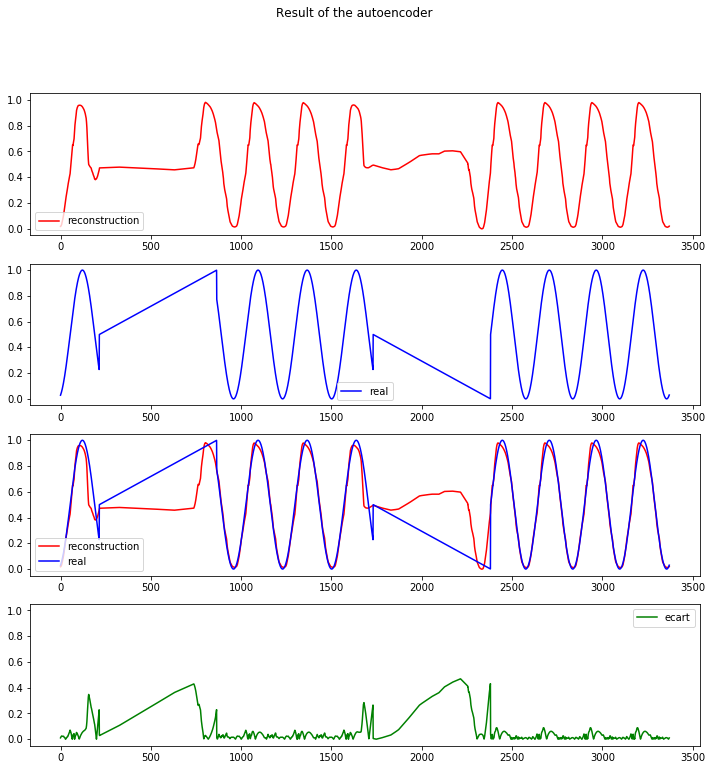

In [23]:
data_X_test=rolling_window(dataset_test,look_back)

data_X_test=data_X_test.reshape(-1, 1,look_back)


if use_cuda:
        #lgr.info ("Using the GPU")    
        test_x = torch.from_numpy(data_X_test).float().cuda() # Note the conversion for pytorch    
else:
        #lgr.info ("Using the CPU")
        test_x = torch.from_numpy(data_X_test).float() # Note the conversion for pytorch



var_data_test = Variable(test_x)
pred_test = net(var_data_test)
pred_test = pred_test.view(-1,128)

reconstruction_viz2(test_x,net,look_back,index=0)

We can observe that the difference is much greater over periods that do not correspond to the "normal" behaviour of the curve! 

A threshold could now be defined to select abnormal periods. 

**Our anomaly detector works fine !**

Let's now try a more complex curve.

# Application to complex series <a name="astrolog"></a>

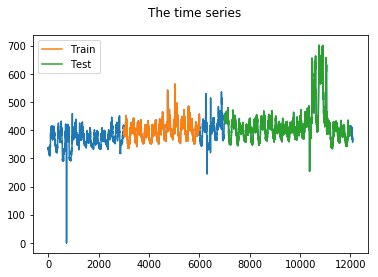

In [24]:
df_total= pd.read_json('Data/serie2.json', lines=True)[['val']]
plt.plot(df_total)

df= pd.read_json('Data/serie2.json', lines=True)[['val']][3000:6000]
plt.plot(df,label="Train")

df_test= pd.read_json('Data/serie2.json', lines=True)[['val']][7000:12000]
plt.plot(df_test,label="Test")

plt.legend()
plt.suptitle("The time series")
plt.show()

In [25]:
dataset = df.values
dataset = dataset.astype('float32')

dataset_test = df_test.values
dataset_test = dataset_test.astype('float32')


In [26]:
dataset,dataset_test=normalize_test(dataset,dataset_test)
data_X=rolling_window(dataset,look_back)

data_X=data_X.reshape(-1, 1,look_back)
if use_cuda:
        #lgr.info ("Using the GPU")    
        train_x = torch.from_numpy(data_X).float().cuda() # Note the conversion for pytorch    
else:
        #lgr.info ("Using the CPU")
        train_x = torch.from_numpy(data_X).float() # Note the conversion for pytorch


In [27]:
net = autoencoder(look_back)

In [28]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(net.parameters(), lr=0.005)

if use_cuda:
    #lgr.info ("Using the GPU")    
    net.cuda()
    criterion.cuda()

**Let's train our autoencoder :  **

In [29]:
net_loss=[]
for e in range(1200):
    var_x = Variable(train_x)
    out = net(var_x)
    loss = criterion(out, var_x)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    net_loss.append(loss.item())
    if (e + 1) % 100 == 0:
        print('Epoch: {}, Loss: {:.5f}'.format(e + 1, loss.item()))

Epoch: 100, Loss: 0.00472
Epoch: 200, Loss: 0.00383
Epoch: 300, Loss: 0.00370
Epoch: 400, Loss: 0.00346
Epoch: 500, Loss: 0.00336
Epoch: 600, Loss: 0.00324
Epoch: 700, Loss: 0.00302
Epoch: 800, Loss: 0.00266
Epoch: 900, Loss: 0.00243
Epoch: 1000, Loss: 0.00236
Epoch: 1100, Loss: 0.00233
Epoch: 1200, Loss: 0.00231


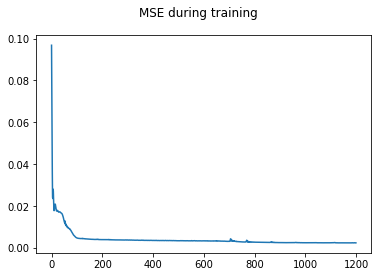

In [30]:
plt.suptitle("MSE during training")
plt.plot(net_loss)
plt.show()

In [31]:
net = net.eval()
if use_cuda:
    #lgr.info ("Using the GPU")    
    net.cuda()

In [32]:
var_data = Variable(train_x)
pred_test = net(var_data)
#print(pred_test.shape)

pred_test = pred_test.view(-1,128)
#print(pred_test.shape)

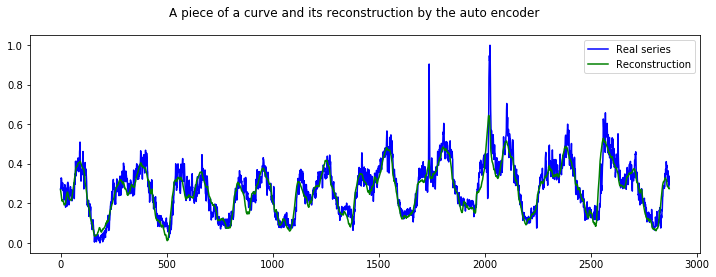

In [33]:
reconstruction_viz(train_x,net,look_back,index=0)

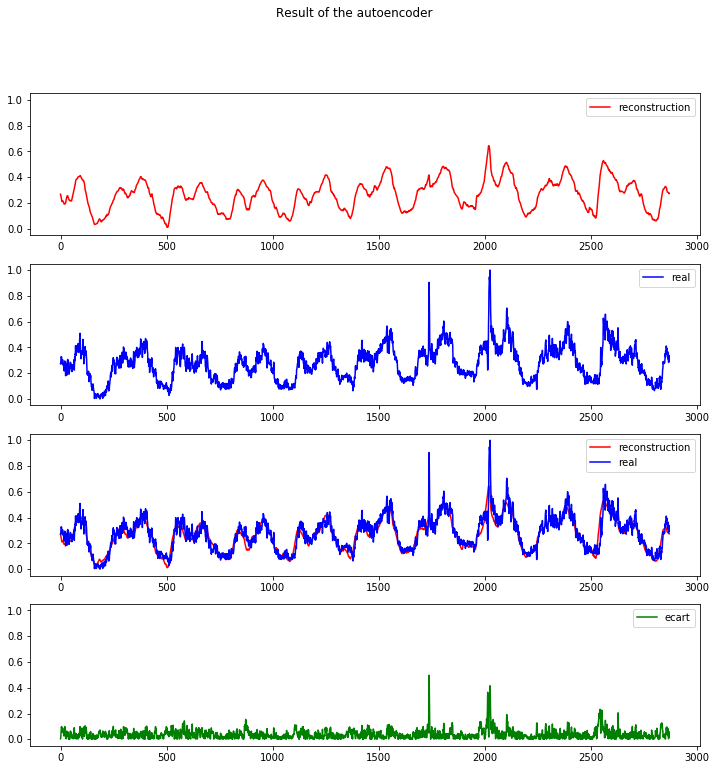

In [34]:
reconstruction_viz2(train_x,net,look_back,index=0)

The autoencoder always learns how to reconstruct the curve well. 

Indeed, the gap between the real curve and the reconstruction remains rather small.

We can already identify some anomalies in our learning period that did not impact the learning of our autoencoder.


Let's now try to apply the autoencoder over our test period.


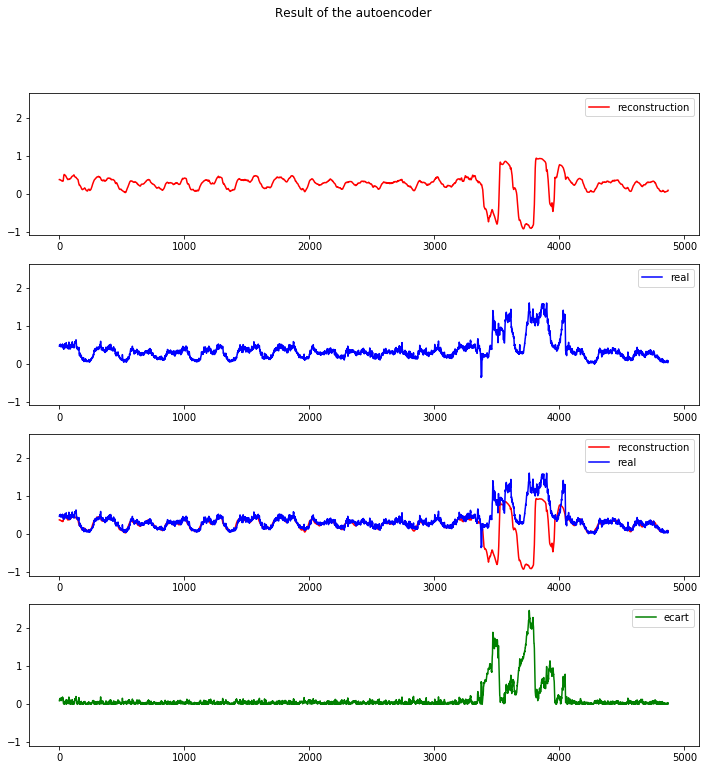

In [35]:
data_X_test=rolling_window(dataset_test,look_back)

data_X_test=data_X_test.reshape(-1, 1,look_back)


if use_cuda:
        #lgr.info ("Using the GPU")    
        test_x = torch.from_numpy(data_X_test).float().cuda() # Note the conversion for pytorch    
else:
        #lgr.info ("Using the CPU")
        test_x = torch.from_numpy(data_X_test).float() # Note the conversion for pytorch


var_data_test = Variable(test_x)
pred_test = net(var_data_test)
pred_test = pred_test.view(-1,128)

reconstruction_viz2(test_x,net,look_back,index=0)

**Same result as before! Our anomaly detector works fine!**

However, it can be observed that the choice of threshold is slightly more complex. 

# Conclusion <a name="conclusion"></a>

The auto encoder is a powerful model that can learn the structure of time series.

However, one point remains to be studied to produce a robust and fully automated approach from an auto encoder.

* an automatic and intelligent choice of the anomaly threshold.


## Bonus: Detection of anomaly via pattern change in the graphical representation

Let's try to transform this time series so that we can create a "texture" representing the patterns.

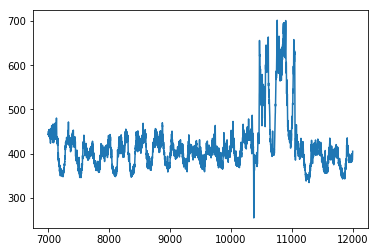

In [36]:
df=  pd.read_json('Data/serie2.json', lines=True)[['val']][7000:12000]
#pd.read_csv('data.csv')[50000:70000]
plt.plot(df)

In [37]:
import sklearn.metrics
def recurrence_plot(s, eps=None, steps=None):
    if eps==None: eps=0.1
    if steps==None: steps=10
    d = sklearn.metrics.pairwise.pairwise_distances(s)
    d = np.floor(d / eps)
    d[d > steps] = steps
    #Z = squareform(d)
    return d

In [38]:
from sklearn import preprocessing

x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_normalize = pd.DataFrame(x_scaled)
#df_normalize.head()

In [39]:
n = 2000  #chunk row size 
k = 25
list_df = np.array([df_normalize[i:i+n].values.tolist() for i in range(0,df_normalize.shape[0]-n,k)] ,  dtype=np.float64)

In [40]:

#j=100
#for i in list_df: 
#    j+=1
#    fig = plt.figure(figsize=(8,8))
#    ax = fig.add_subplot(2, 1, 1)
#    ax.axis('off')
#    ax.imshow(recurrence_plot(i))
#    ax = fig.add_subplot(2, 1, 2)
#    ax.axis('off')
#    ax.plot(i)
#    fig.savefig('../images4Gif/img_'+str(j)+'.png')   # save the figure to file
#    plt.close(fig)

By taking the absolute deviation of each value pair in the time series, we obtain a 2D representation of it.

Ps: The higher the value, the lighter the color. The "image" obtained is of course symmetry since the difference between a point x1 and x2 is equivalent to the difference between point x2 and x1.

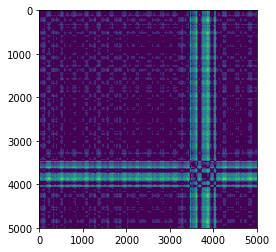

In [41]:

import sklearn.metrics.pairwise
import matplotlib.pyplot as plt

plt.imshow(recurrence_plot(df_normalize))
#plt.savefig('myimage.svg', format='svg', dpi=1200)

## Pattern change on several Time-Series

Let's try different time series to see if we can easily detect pattern changes.

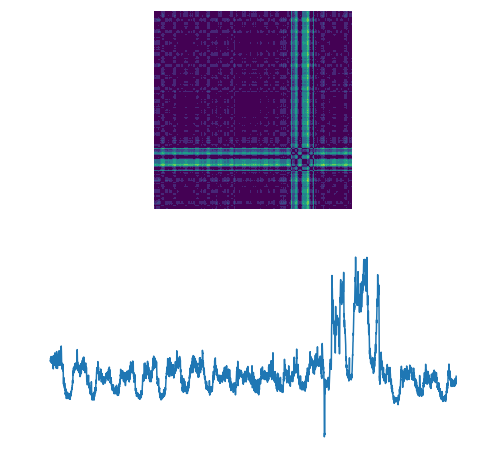

In [42]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.imshow(recurrence_plot(df_normalize))
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df_normalize)

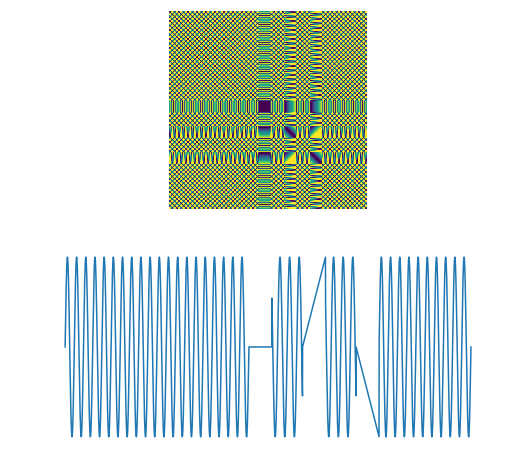

In [43]:

s = serie_simple
df = pd.DataFrame(s)
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.imshow(recurrence_plot(df))
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df)

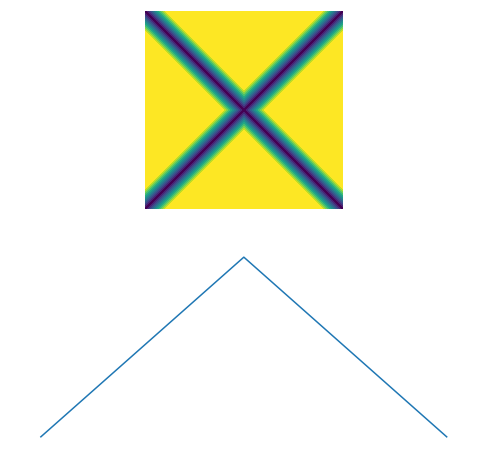

In [44]:
s= np.array(list(np.arange(int(20000/4))/int(20000/4)))*5
s = np.append(s,s[::-1])
df = pd.DataFrame(s)
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.imshow(recurrence_plot(df))
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df)

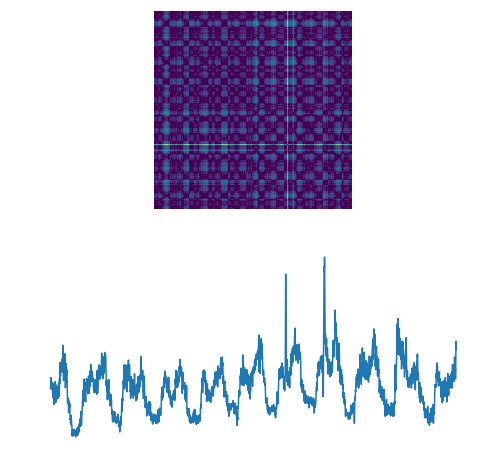

In [45]:
df= pd.read_json('Data/serie2.json', lines=True)[['val']][3000:6000]
x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_normalize = pd.DataFrame(x_scaled)
df_normalize.head()
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.imshow(recurrence_plot(df_normalize))
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df_normalize)


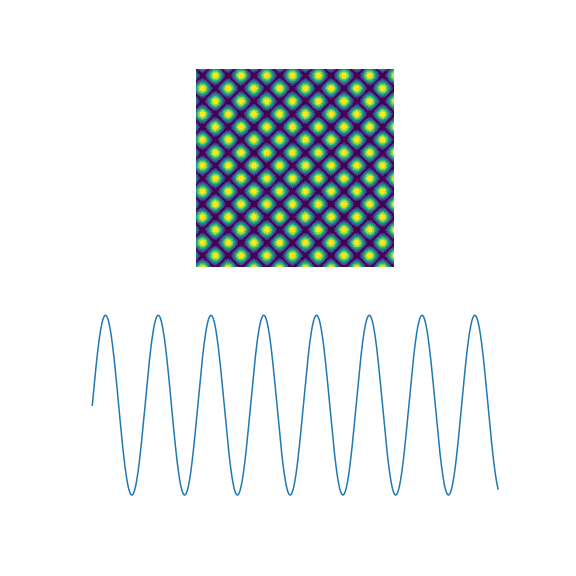

In [46]:
from IPython.display import Image
Image(filename="Data/courbe2.gif")

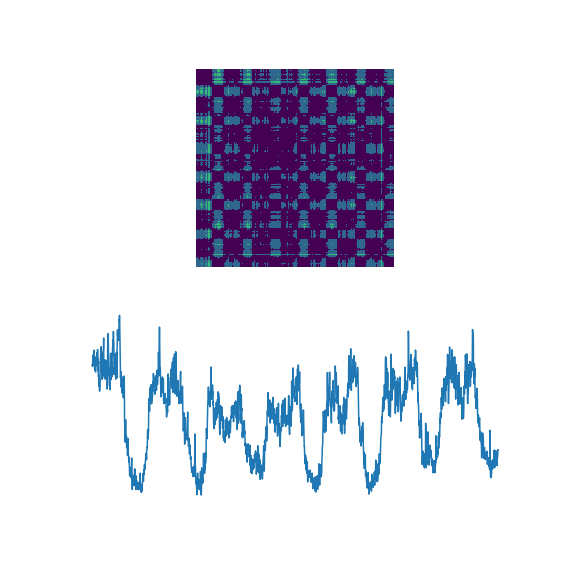

In [47]:
from IPython.display import Image
Image(filename="Data/courbe1.gif")

This way of visualizing time series is interesting because we already know that neural networks on images are extremely strong at detecting "textures" and this is exactly what we are transforming our time series into.